In [2]:
# plot the fields of our need
import matplotlib.pyplot as plt
import pyvista as pv
from matplotlib.patches import FancyArrowPatch
import numpy as np
import os

# load the vtu file
filename = "derivative-visualisation/derivative-visualisation_0.vtu"

# print all the fields in the vtu file after reading it
data = pv.read(filename)
print(data.point_data.keys())



['Velocity', 'Pressure', 'Temperature', 'Observed Velocity', 'Temp', 'Observed Viscosity', 'Viscosity', 'Observed DT', 'Dynamic_Topography', 'Derivative Activation Energy', 'Derivative Temperature', 'Average Temperature', 'Average Viscosity']


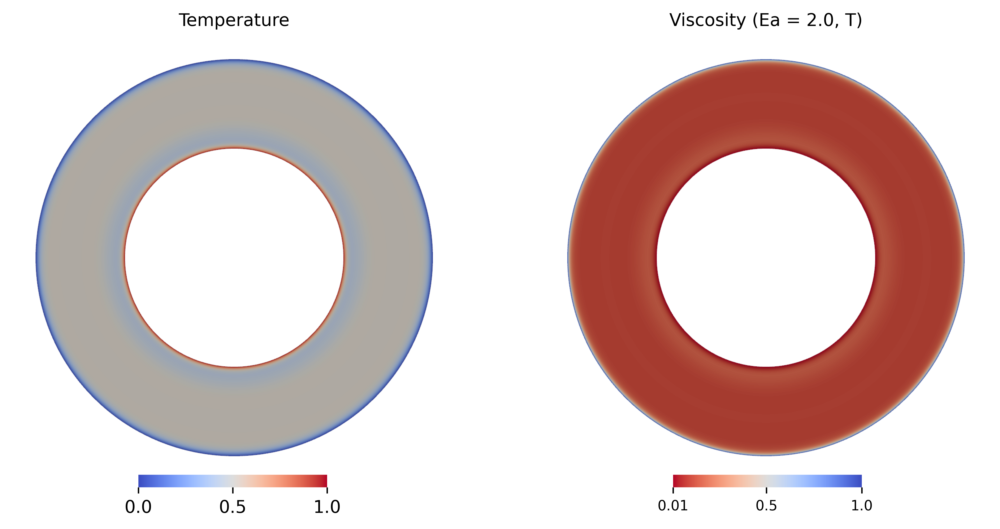

In [ ]:
import matplotlib.pyplot as plt
import pyvista as pv
import os

# Load the VTU file
filename = "derivative-visualisation/derivative-visualisation_0.vtu"
data = pv.read(filename)

# Extract Temperature and Viscosity fields
temperature_field = 'Temp'
viscosity_field = 'Viscosity'

# Create a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=600)  # Adjust figure size as needed
axes = axes.flatten()

# Plot Temperature
plotter_temp = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_temp.add_mesh(data, scalars=temperature_field, cmap="coolwarm", show_scalar_bar=False)
plotter_temp.camera_position = "xy"
plotter_temp.camera.zoom(1.3)
plotter_temp.screenshot("temp_field.png")  # Save a temporary screenshot

img_temp = plt.imread("temp_field.png")
axes[0].imshow(img_temp)
axes[0].set_title("Temperature", fontsize=10)
axes[0].axis('off')  # Turn off axis
os.remove("temp_field.png")  # Remove the temporary file

# Plot Viscosity
plotter_visc = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_visc.add_mesh(data, scalars=viscosity_field, cmap="coolwarm_r", show_scalar_bar=False)  # Reversed colormap
plotter_visc.camera_position = "xy"
plotter_visc.camera.zoom(1.3)
plotter_visc.screenshot("visc_field.png")  # Save a temporary screenshot

img_visc = plt.imread("visc_field.png")
axes[1].imshow(img_visc)
axes[1].set_title("Viscosity (Ea = 2.0, T)", fontsize=10)
axes[1].axis('off')  # Turn off axis
os.remove("visc_field.png")  # Remove the temporary file

# Create color bars for both subplots
# Temperature color bar
temp_min, temp_max = data.point_data[temperature_field].min(), data.point_data[temperature_field].max()
cbar_ax_temp = fig.add_axes([0.225, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_temp = plt.Normalize(vmin=temp_min, vmax=temp_max)
cbar_temp = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm", norm=norm_temp),
    cax=cbar_ax_temp,
    orientation="horizontal"
)
cbar_temp.outline.set_visible(False)  # Remove outline

# Viscosity color bar
visc_min, visc_max = data.point_data[viscosity_field].min(), data.point_data[viscosity_field].max()
cbar_ax_visc = fig.add_axes([0.650, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_visc = plt.Normalize(vmin=visc_min, vmax=visc_max)
cbar_visc = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm_visc),
    cax=cbar_ax_visc,
    orientation="horizontal"
)
# Explicitly set ticks to include 0.01
cbar_visc.set_ticks([0.01, 0.5, 1])
cbar_visc.ax.set_xticklabels(["0.01", "0.5", "1.0"], fontsize=8)

cbar_visc.outline.set_visible(False)  # Remove outline

# Adjust layout and fix spacing
# plt.tight_layout()
plt.show()


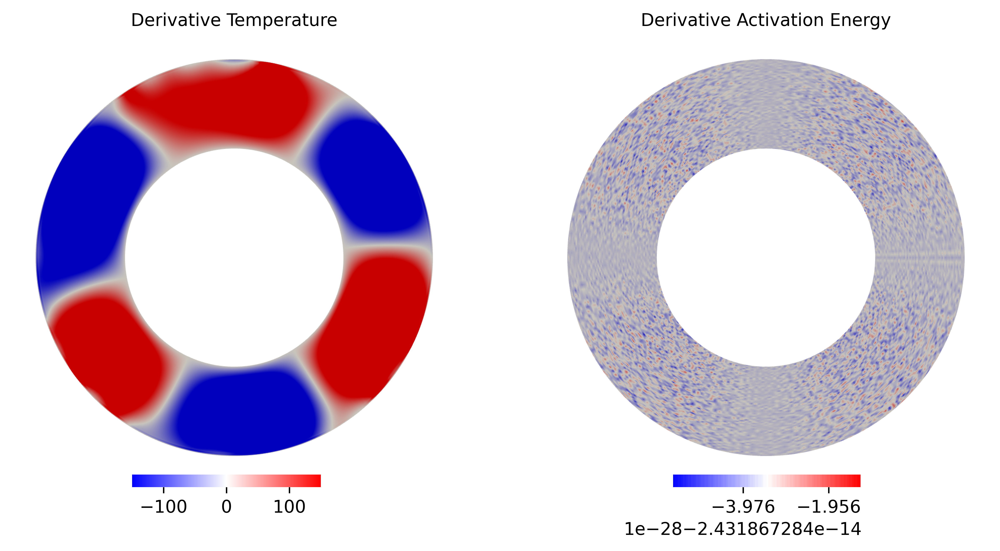

In [14]:
import matplotlib.pyplot as plt
import pyvista as pv
import os

# Load the VTU file
filename = "derivative-visualisation/derivative-visualisation_0.vtu"
data = pv.read(filename)

# Extract Derivative fields
derivative_temp_field = 'Derivative Temperature'
derivative_ea_field = 'Derivative Activation Energy'

# Create a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=600)  # Adjust figure size as needed
axes = axes.flatten()

# Plot Derivative Temperature
plotter_dtemp = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_dtemp.add_mesh(
    data,
    scalars=derivative_temp_field,
    cmap="bwr",
    clim=[-150, 150],  # Set color map limits
    show_scalar_bar=False,
)
plotter_dtemp.camera_position = "xy"
plotter_dtemp.camera.zoom(1.3)
plotter_dtemp.screenshot("dtemp_field.png")  # Save a temporary screenshot

img_dtemp = plt.imread("dtemp_field.png")
axes[0].imshow(img_dtemp)
axes[0].set_title("Derivative Temperature", fontsize=10)
axes[0].axis('off')  # Turn off axis
os.remove("dtemp_field.png")  # Remove the temporary file

# Plot Derivative Activation Energy
plotter_dea = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_dea.add_mesh(data, scalars=derivative_ea_field, cmap="bwr", show_scalar_bar=False)
plotter_dea.camera_position = "xy"
plotter_dea.camera.zoom(1.3)
plotter_dea.screenshot("dea_field.png")  # Save a temporary screenshot

# Add color bars for both subplots

# Derivative Temperature color bar
dtemp_min, dtemp_max = -150, 150  # Fixed color map limits
cbar_ax_dtemp = fig.add_axes([0.22, 0.13, 0.15, 0.02])  # Adjust position as needed
norm_dtemp = plt.Normalize(vmin=dtemp_min, vmax=dtemp_max)
cbar_dtemp = plt.colorbar(
    plt.cm.ScalarMappable(cmap="bwr", norm=norm_dtemp),
    cax=cbar_ax_dtemp,
    orientation="horizontal"
)

cbar_dtemp.outline.set_visible(False)  # Remove outline

# Derivative Activation Energy color bar
dea_min, dea_max = data.point_data[derivative_ea_field].min(), data.point_data[derivative_ea_field].max()
cbar_ax_dea = fig.add_axes([0.65, 0.13, 0.15, 0.02])  # Adjust position as needed
norm_dea = plt.Normalize(vmin=dea_min, vmax=dea_max)
cbar_dea = plt.colorbar(
    plt.cm.ScalarMappable(cmap="bwr", norm=norm_dea),
    cax=cbar_ax_dea,
    orientation="horizontal"
)

cbar_dea.outline.set_visible(False)  # Remove outline


img_dea = plt.imread("dea_field.png")
axes[1].imshow(img_dea)
axes[1].set_title("Derivative Activation Energy", fontsize=10)
axes[1].axis('off')  # Turn off axis
os.remove("dea_field.png")  # Remove the temporary file

# Show the plots
plt.show()


['Derivative DT misfit', 'Derivative Velocity misfit', 'Derivative Smoothing', 'Derivative Damping']


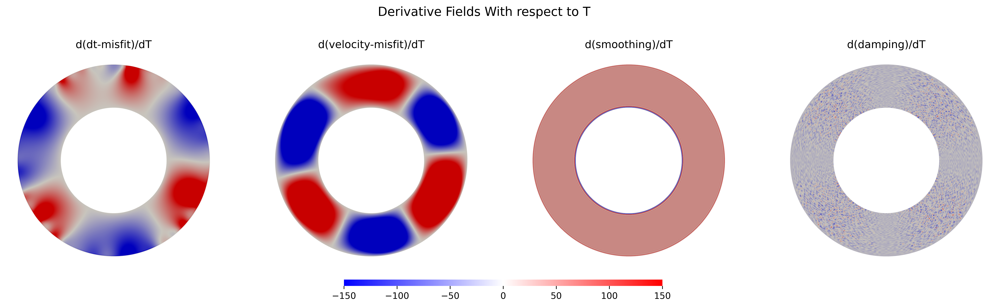

In [1]:
import matplotlib.pyplot as plt
import pyvista as pv
import os

# Load the VTU file
filename = "derivative-visualisation/derivative-visualisation_0.vtu"
data = pv.read(filename)

# print all the fields in the vtu file after reading it
print(data.point_data.keys())

# make (1,4) subplots for ['Derivative DT misfit', 'Derivative Velocity misfit', 'Derivative Smoothing', 'Derivative Damping']
fig, axes = plt.subplots(1,4, figsize=(20,5), dpi=600)  # Adjust figure size as needed
axes = axes.flatten()
# plot title
fig.suptitle("Derivative Fields With respect to T", fontsize=14)

# Extract fields
derivative_dt_misfit_field = 'Derivative DT misfit'
derivative_velocity_misfit_field = 'Derivative Velocity misfit'
derivative_smoothing_field = 'Derivative Smoothing'
derivative_damping_field = 'Derivative Damping'

# Plot Derivative DT misfit
plotter_ddt_misfit = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_ddt_misfit.add_mesh(
    data,
    scalars=derivative_dt_misfit_field,
    cmap="bwr",
    clim=[-150, 150],  # Set color map limits
    show_scalar_bar=False,
)
plotter_ddt_misfit.camera_position = "xy"
plotter_ddt_misfit.camera.zoom(1.3)
plotter_ddt_misfit.screenshot("ddt_misfit_field.png")  # Save a temporary screenshot

img_ddt_misfit = plt.imread("ddt_misfit_field.png")
axes[0].imshow(img_ddt_misfit)
axes[0].set_title("d(dt-misfit)/dT", fontsize=12)
axes[0].axis('off')  # Turn off axis
os.remove("ddt_misfit_field.png")  # Remove the temporary file

# Plot Derivative Velocity misfit
plotter_dvelocity_misfit = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_dvelocity_misfit.add_mesh(
    data,
    scalars=derivative_velocity_misfit_field,
    cmap="bwr",
    clim=[-150, 150],  # Set color map limits
    show_scalar_bar=False,
)
plotter_dvelocity_misfit.camera_position = "xy"
plotter_dvelocity_misfit.camera.zoom(1.3)
plotter_dvelocity_misfit.screenshot("dvelocity_misfit_field.png")  # Save a temporary screenshot

img_dvelocity_misfit = plt.imread("dvelocity_misfit_field.png")
axes[1].imshow(img_dvelocity_misfit)
axes[1].set_title("d(velocity-misfit)/dT", fontsize=12)
axes[1].axis('off')  # Turn off axis
os.remove("dvelocity_misfit_field.png")  # Remove the temporary

# Plot Derivative Smoothing
plotter_dsmoothing = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_dsmoothing.add_mesh(
    data,
    scalars=derivative_smoothing_field,
    cmap="bwr",
     # Set color map limits
    show_scalar_bar=False,
)
plotter_dsmoothing.camera_position = "xy"
plotter_dsmoothing.camera.zoom(1.3)
plotter_dsmoothing.screenshot("dsmoothing_field.png")  # Save a temporary screenshot

img_dsmoothing = plt.imread("dsmoothing_field.png")
axes[2].imshow(img_dsmoothing)
axes[2].set_title("d(smoothing)/dT", fontsize=12)
axes[2].axis('off')  # Turn off axis
os.remove("dsmoothing_field.png")  # Remove the temporary file

# Plot Derivative Damping
plotter_ddamping = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_ddamping.add_mesh(
    data,
    scalars=derivative_damping_field,
    cmap="bwr",
      # Set color map limits
    show_scalar_bar=False,
)
plotter_ddamping.camera_position = "xy"
plotter_ddamping.camera.zoom(1.3)
plotter_ddamping.screenshot("ddamping_field.png")  # Save a temporary screenshot

img_ddamping = plt.imread("ddamping_field.png")
axes[3].imshow(img_ddamping)
axes[3].set_title("d(damping)/dT", fontsize=12)
axes[3].axis('off')  # Turn off axis
os.remove("ddamping_field.png")  # Remove

# include common color bar for all the subplots at the bottom
# color bar limits
dmin, dmax = -150, 150
# color bar position
cbar_ax = fig.add_axes([0.39, 0.1, 0.25, 0.02])  # Adjust position as needed
norm = plt.Normalize(vmin=dmin, vmax=dmax)
cbar = plt.colorbar(
    plt.cm.ScalarMappable(cmap="bwr", norm=norm),
    cax=cbar_ax,
    orientation="horizontal"
)

cbar.outline.set_visible(False)  # Remove outline



# Show the plots
plt.show()



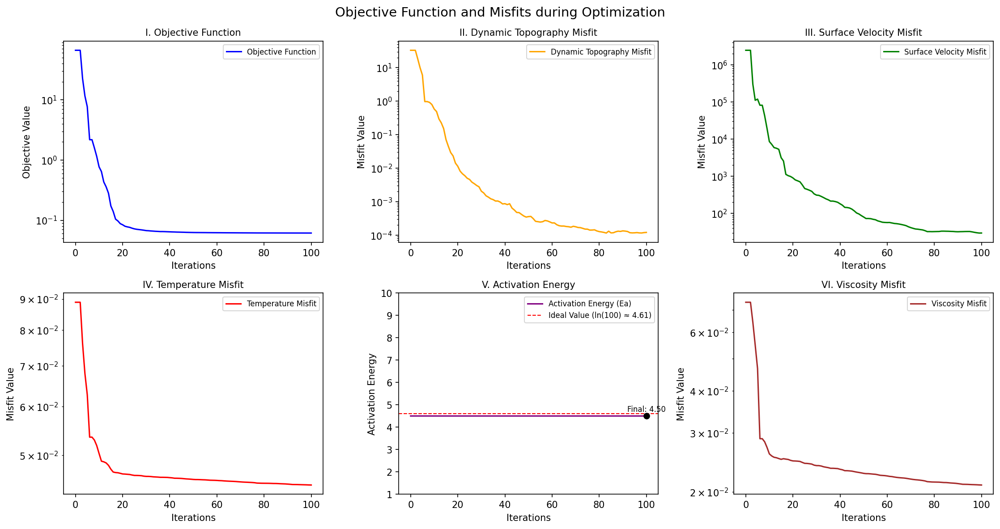

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# Load the data
objective_array = np.load("objective_array.npy")
viscosity_misfit_array = np.load("viscosity_misfit_array.npy")
temperature_misfit_array = np.load("temperature_misfit_array.npy")
activation_array = np.load("activation_misfit_array.npy")
dt_misfit_array = np.load("dt_misfit_array.npy")
u_misfit_array = np.load("u_misfit_array.npy")

# Determine the number of iterations
iterations = np.arange(len(objective_array))

# Ideal value for Ea
ideal_ln100 = np.log(100)

# Create the 2x3 subplot figure
fig, axes = plt.subplots(2, 3, figsize=(15, 8), dpi=150)
# Plot title
fig.suptitle("Objective Function and Misfits during Optimization", fontsize=14)

# Plot Objective Function
axes[0, 0].plot(iterations, objective_array, color='blue', label="Objective Function")
axes[0, 0].set_title("I. Objective Function", fontsize=10)
axes[0, 0].set_yscale("log")
axes[0, 0].set_xlabel("Iterations")
axes[0, 0].set_ylabel("Objective Value")
axes[0, 0].legend(fontsize=8)

# Plot Dynamic Topography Misfit
axes[0, 1].plot(iterations, dt_misfit_array, color='orange', label="Dynamic Topography Misfit")
axes[0, 1].set_title("II. Dynamic Topography Misfit", fontsize=10)
axes[0, 1].set_yscale("log")
axes[0, 1].set_xlabel("Iterations")
axes[0, 1].set_ylabel("Misfit Value")
axes[0, 1].legend(fontsize=8)

# Plot Surface Velocity Misfit
axes[0, 2].plot(iterations, u_misfit_array, color='green', label="Surface Velocity Misfit")
axes[0, 2].set_title("III. Surface Velocity Misfit", fontsize=10)
axes[0, 2].set_yscale("log")
axes[0, 2].set_xlabel("Iterations")
axes[0, 2].set_ylabel("Misfit Value")
axes[0, 2].legend(fontsize=8)

# Plot Temperature Misfit
axes[1, 0].plot(iterations, temperature_misfit_array, color='red', label="Temperature Misfit")
axes[1, 0].set_title("IV. Temperature Misfit", fontsize=10)
axes[1, 0].set_yscale("log")
axes[1, 0].set_xlabel("Iterations")
axes[1, 0].set_ylabel("Misfit Value")
axes[1, 0].legend(fontsize=8)

# Plot Activation Energy (Ea) with restricted range
axes[1, 1].plot(iterations, activation_array, color='purple', label="Activation Energy (Ea)")
axes[1, 1].axhline(y=ideal_ln100, color='red', linestyle="--", linewidth=1, label=f"Ideal Value (ln(100) ≈ {ideal_ln100:.2f})")
axes[1, 1].set_ylim(1.0, 10.0)  # Set y-axis range

# Add final value of activation energy to the curve
final_activation = activation_array[-1]  # Get the last value in the array
axes[1, 1].scatter(len(activation_array) - 1, final_activation, color='black', zorder=5)  # Mark the final point
axes[1, 1].text(len(activation_array) - 1, final_activation + 0.2,  # Adjust vertical offset
                f"Final: {final_activation:.2f}", color='black', fontsize=8, ha='center')

axes[1, 1].set_title("V. Activation Energy", fontsize=10)
axes[1, 1].set_xlabel("Iterations")
axes[1, 1].set_ylabel("Activation Energy")
axes[1, 1].legend(fontsize=8)


# Plot Viscosity Misfit
axes[1, 2].plot(iterations, viscosity_misfit_array, color='brown', label="Viscosity Misfit")
axes[1, 2].set_title("VI. Viscosity Misfit", fontsize=10)
axes[1, 2].set_yscale("log")
axes[1, 2].set_xlabel("Iterations")
axes[1, 2].set_ylabel("Misfit Value")
axes[1, 2].legend(fontsize=8)

# Adjust layout for clarity
plt.tight_layout()

# Show the plot
plt.show()


['Temperature Control', 'Viscosity', 'Dynamic_Topography', 'Inverse Velocity', 'Temperature', 'Observed Viscosity', 'Observed DT', 'Observed Velocity']


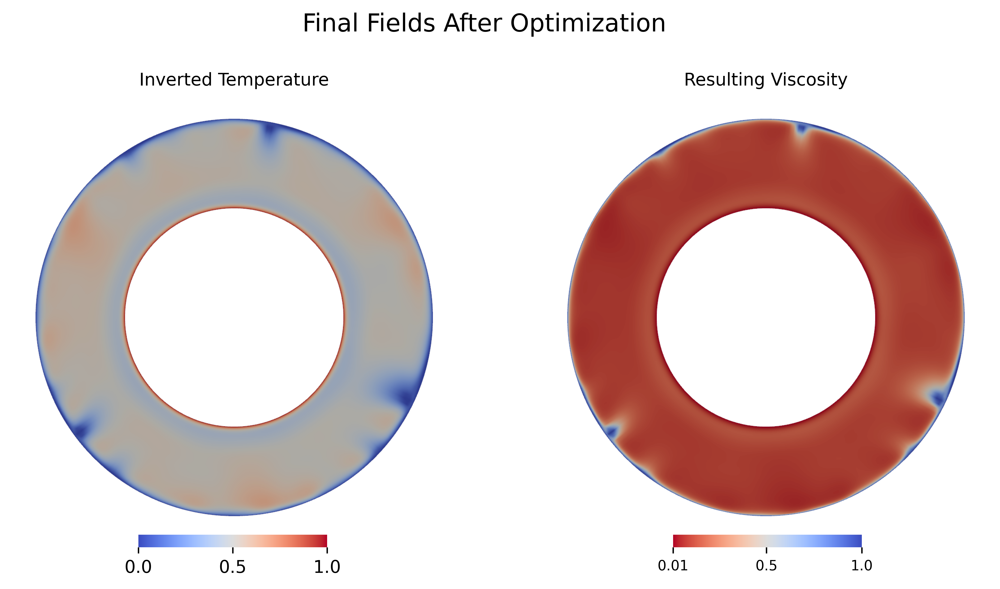

In [31]:
# in this block we will plot the final fields after the optimization
#  temperature and viscosity fields using PyVista
import pyvista as pv
import matplotlib.pyplot as plt
import os
import numpy as np

# Load the VTU file
filename = "solutions/solutions_100.vtu"
data = pv.read(filename)

# print all the fields in the vtu file after reading it
print(data.point_data.keys())

# 'Temperature Control', 'Viscosity' extracted from the vtu file
temperature_field = 'Temperature Control'
viscosity_field = 'Viscosity'

# Create a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=600)  # Adjust figure size as needed
axes = axes.flatten()
# plot title
fig.suptitle("Final Fields After Optimization", fontsize=14)

# Plot Temperature
plotter_temp = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_temp.add_mesh(data, scalars=temperature_field, cmap="coolwarm", show_scalar_bar=False)
plotter_temp.camera_position = "xy"
plotter_temp.camera.zoom(1.3)
plotter_temp.screenshot("temp_field.png")  # Save a temporary screenshot

img_temp = plt.imread("temp_field.png")
axes[0].imshow(img_temp)
axes[0].set_title("Inverted Temperature", fontsize=10)
axes[0].axis('off')  # Turn off axis
os.remove("temp_field.png")  # Remove the temporary file

# color bar for temperature
temp_min, temp_max = [0,1]
cbar_ax_temp = fig.add_axes([0.225, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_temp = plt.Normalize(vmin=temp_min, vmax=temp_max)
cbar_temp = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm", norm=norm_temp),
    cax=cbar_ax_temp,
    orientation="horizontal"
)
cbar_temp.outline.set_visible(False)  # Remove outline

# Plot Viscosity
plotter_visc = pv.Plotter(off_screen=True, window_size=[1080, 1080])  # Square window
plotter_visc.add_mesh(data, scalars=viscosity_field, cmap="coolwarm_r", show_scalar_bar=False)  # Reversed colormap
plotter_visc.camera_position = "xy"
plotter_visc.camera.zoom(1.3)
plotter_visc.screenshot("visc_field.png")  # Save a temporary screenshot

img_visc = plt.imread("visc_field.png")
axes[1].imshow(img_visc)
axes[1].set_title("Resulting Viscosity", fontsize=10)
axes[1].axis('off')  # Turn off axis
os.remove("visc_field.png")  # Remove the temporary file

# color bar for viscosity
visc_min, visc_max = [0.01,1.0]
cbar_ax_visc = fig.add_axes([0.650, 0.13, 0.15, 0.02])  # Adjust position (closer and centered)
norm_visc = plt.Normalize(vmin=visc_min, vmax=visc_max)
cbar_visc = plt.colorbar(
    plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm_visc),
    cax=cbar_ax_visc,
    orientation="horizontal"
)
# Explicitly set ticks to include 0.01
cbar_visc.set_ticks([0.01, 0.5, 1])
cbar_visc.ax.set_xticklabels(["0.01", "0.5", "1.0"], fontsize=8)

cbar_visc.outline.set_visible(False)  # Remove outline

# Adjust layout and fix spacing
# plt.tight_layout()
plt.show()

